In [1]:
# Import required packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import math
import glob
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

# Camera calibration using chessboard images

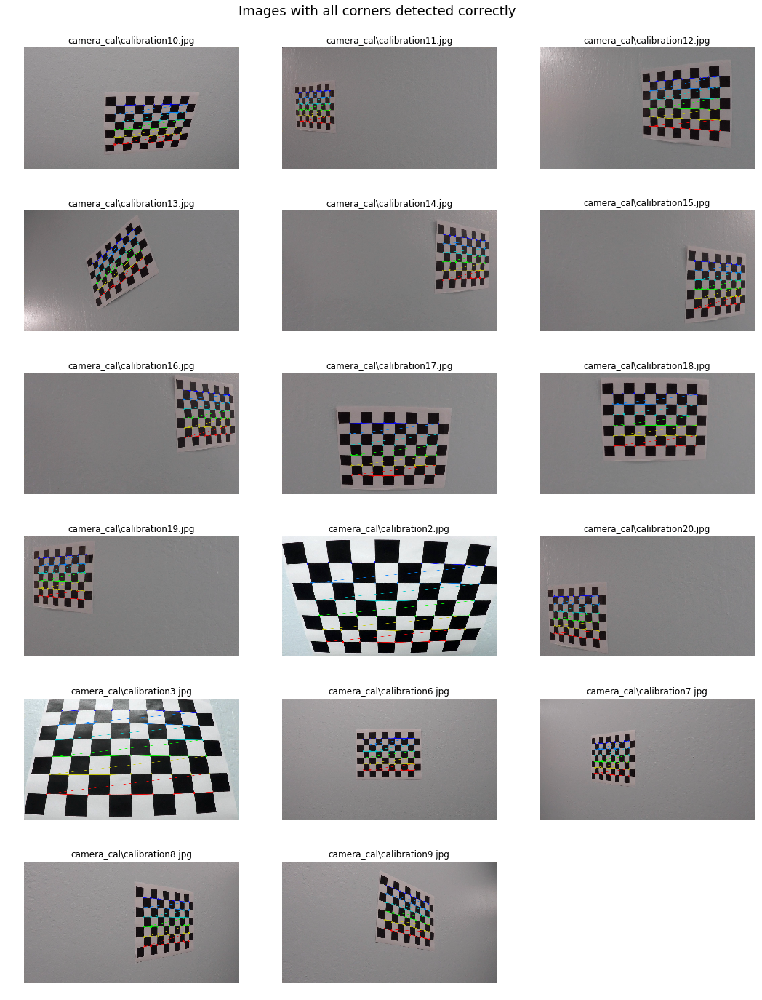

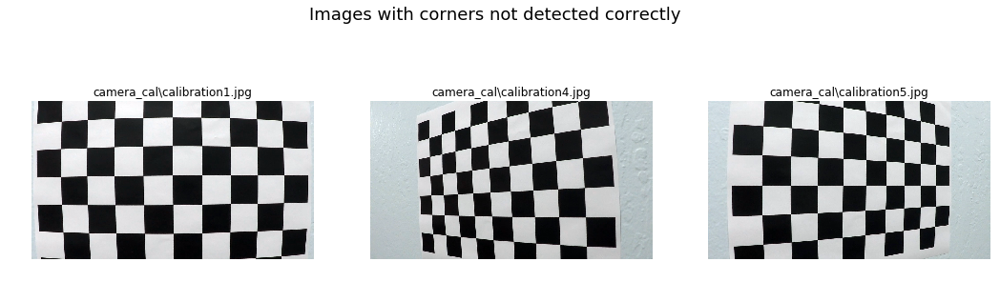

In [2]:
# Chessboard dimensions - 9x6
xCorners = 9
yCorners = 6

# Create object points like (0,0,0), (1,0,0), (2,0,0) ....
objp = np.zeros((yCorners * xCorners,3), np.float32)
objp[:,:2] = np.mgrid[0:xCorners, 0:yCorners].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Import all camera calibration images using glob
images = glob.glob('camera_cal/calibration*.jpg') 

#Calibration images in which opencv failed to find corners
corners_not_found = [] 
plt.figure(figsize=(18, 24)) 

plt.figtext(0.5,0.9,'Images with all corners detected correctly', fontsize=18, ha='center')

# Iterate through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (xCorners, yCorners), None) 
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        plt.subplot(6, 3, len(imgpoints))
        cv2.drawChessboardCorners(img, (xCorners, yCorners), corners, ret)
        plt.imshow(img)
        plt.title(fname)
        plt.axis('off')
    else:
        corners_not_found.append(fname)
plt.show()

# Display images
plt.figure(figsize=(18, 24))
plt.figtext(.5,.6,'Images with corners not detected correctly', fontsize=18, ha='center')
for i, p in enumerate(corners_not_found):
    plt.subplot(1, 3, i+1)
    plt.imshow(cv2.imread(p)) 
    plt.title(p)
    plt.axis('off')
plt.show()

# Undistort image

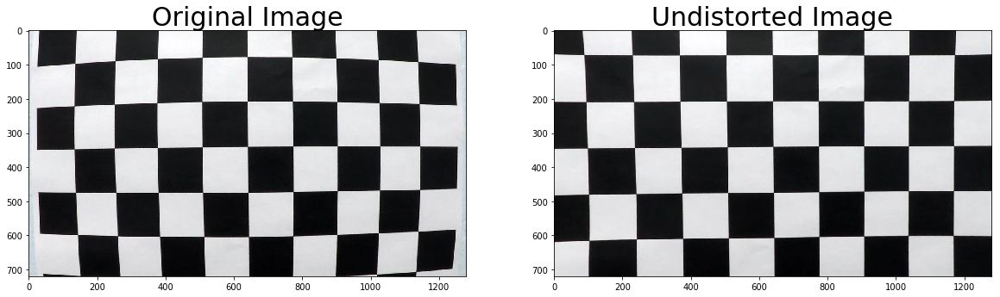

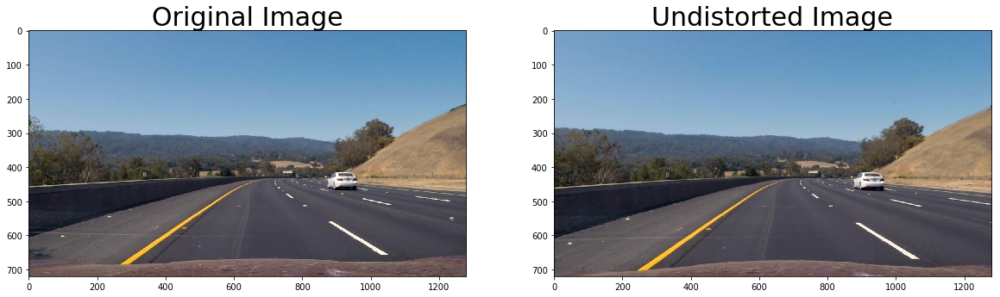

In [3]:
# Test undistortion on an image
image = cv2.imread('camera_cal/calibration1.jpg')
image_size = (image.shape[1], image.shape[0])

# Use object points and image points from camera calibration
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_size,None,None)

def undistort(image):
    return cv2.undistort(image, mtx, dist, None, mtx)

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original Image", fontsize=30)

plt.subplot(1, 2, 2)
plt.imshow(undistort(image))
plt.title("Undistorted Image", fontsize=30)
plt.savefig("output_images/undistortChessboard.jpg")
plt.show()

# Undistort test image
plt.figure(figsize=(20, 10))
image = cv2.imread('test_images/test3.jpg')
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image", fontsize=30)

plt.subplot(1, 2, 2)
undistort_image = undistort(image)
plt.imshow(cv2.cvtColor(undistort_image, cv2.COLOR_BGR2RGB))
plt.title("Undistorted Image", fontsize=30)
plt.savefig("output_images/undistort_test5.jpg")

# Sharpen Image

In [4]:
def gaussianBlur(image, kernel_size):
    # Apply a Gaussian Noise kernel
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

def weightedImage(image, initial_image, α=0.5, β=1., γ=0.):
    # Add weights to the image
    return cv2.addWeighted(initial_image, α, image, β, γ)

# Color and Gradient thresholding

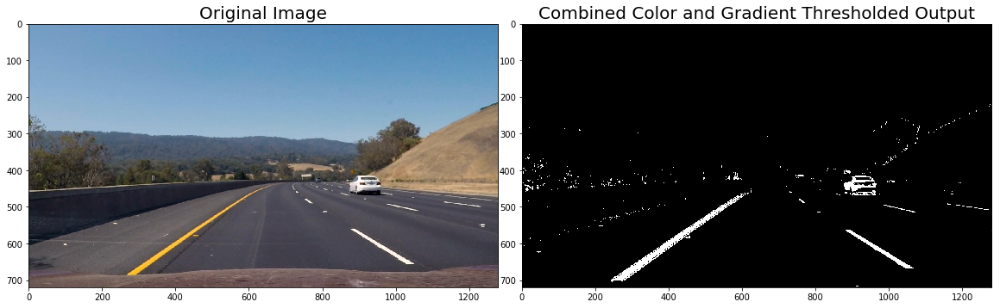

In [5]:
def colorAndGradientThres(image, s_thresh=(170, 255), l_thresh=(190, 255), sx_thresh=(25, 100)):
    img = np.copy(image)
    
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    
    # Normalize L channel
    l_channel = hls[:,:,1]
    l_channel = l_channel*(255/np.max(l_channel))
    
    # Normalize S channel
    s_channel = hls[:,:,2]
    s_channel = s_channel*(255/np.max(s_channel))
        
    # Sobel x
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold X gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1

    # S Channel Threshold for yellow colored lane lines
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # L Channel Threshold for white colored lane lines
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    # Combined color and gradient thresholded image
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(l_binary == 1) | (s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary

# Display images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)

colorGradientOut = colorAndGradientThres(undistort_image, s_thresh=(170, 255), l_thresh=(190, 255), sx_thresh=(20, 100))
ax2.imshow(colorGradientOut, cmap='gray')
ax2.set_title('Combined Color and Gradient Thresholded Output', fontsize=20)

# Perspective Transform

Height (Y axis vertical):  720 Width (X axis horizontal):  1280


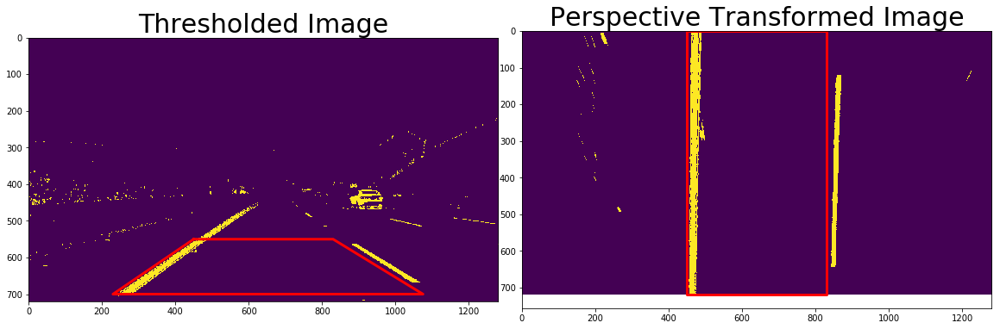

In [6]:
# Image Height and Image Width
H,W = colorGradientOut.shape[:2]
print("Height (Y axis vertical): ", H, "Width (X axis horizontal): ", W)

# Define source and destination points for transform
src = np.float32([(450,550), (830,550), (230,700), (1075,700)])

dst = np.float32([(450,0), (W-450,0), (450,H), (W-450,H)])

def perspectiveTransform(image, src, dst):
    H,W = image.shape[:2]
    
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(image, M, (W,H), flags=cv2.INTER_LINEAR)
    
    return warped, Minv

perspectiveTransformOut, Minv = perspectiveTransform(colorGradientOut, src, dst)

# Display images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(colorGradientOut)
x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(x, y, color='red', linewidth=3)
ax1.set_ylim([H,0])
ax1.set_xlim([0,W])
ax1.set_title('Thresholded Image', fontsize=30)

ax2.imshow(perspectiveTransformOut)
xt = [dst[0][0],dst[2][0],dst[3][0],dst[1][0],dst[0][0]]
yt = [dst[0][1],dst[2][1],dst[3][1],dst[1][1],dst[0][1]]
ax2.plot(xt, yt, color='red', linewidth=3)
ax2.set_title('Perspective Transformed Image', fontsize=30)

# Pipeline

In [7]:
def pipeline(image):
    
    # Define source and destination points for transform
    src = np.float32([(450,550), (830,550), (230,700), (1075,700)]) 
    dst = np.float32([(450,0), (W-450,0), (450,H), (W-450,H)])
    
    #Undistort image
    undistortOut = undistort(image)
    
    # Gaussian Blur
    kernel_size = 5
    blurImage = gaussianBlur(undistortOut, kernel_size)
    
    # Color and Gradient thresholding
    colorGradientThresOut = colorAndGradientThres(blurImage, s_thresh=(170, 255), l_thresh=(190, 255) , sx_thresh=(25, 100))
   
    # Perspective Transform
    perspectiveTransformOut, Minv = perspectiveTransform(colorGradientThresOut, src, dst)
    
    return perspectiveTransformOut, Minv

# Run pipeline on all test images

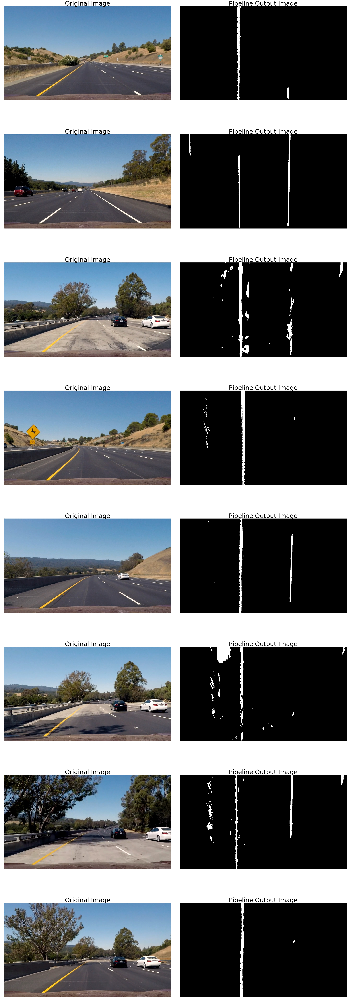

In [8]:
# Test pipeline on all test images 
images = glob.glob('test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(50, 150))
fig.subplots_adjust(hspace = .2, wspace=.05)
axs = axs.ravel()
                  
i = 0
for image in images:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[i].imshow(img)
    axs[i].set_title('Original Image', fontsize=50)
    axs[i].axis('off')
    i += 1
    
    img_bin, Minv = pipeline(img)
    axs[i].imshow(img_bin, cmap='gray')
    axs[i].set_title('Pipeline Output Image', fontsize=50)
    axs[i].axis('off')
    i += 1

# Sliding Window Polyfit

X-intercepts of lanes: 463.353706327 844.938333519


(720, 0)

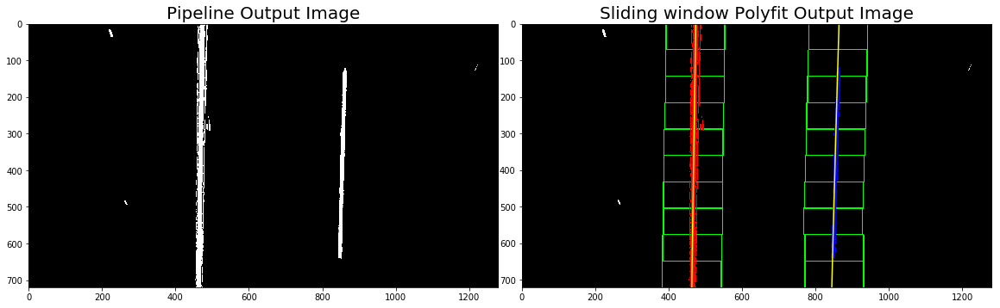

In [9]:
# Define method to fit polynomial to binary image with lines extracted, using sliding window  
def slidingWindowPolyfit(image):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(image[image.shape[0]//2:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    
    # Consider only quarter of the histrogram (left and right of the midpoint)
    quarter_point = np.int(midpoint//2)
    
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint

    # Choose the number of sliding windows
    nwindows = 10
    
    # Set height of windows
    window_height = np.int(image.shape[0]/nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Rectangle data for visualization
    rectangle_data = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = image.shape[0] - (window+1)*window_height
        win_y_high = image.shape[0] - window*window_height
        
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    
    # Distance between the lowest and the highest points in Y direction in righty in pixels will be used to co relate 
    # the actual dashed lane marking length i.e. 10 feet
    righty = nonzeroy[right_lane_inds] 

    left_fit, right_fit = (None, None)
    
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)

    visualization_data = (rectangle_data, histogram)

    return left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data    

# Display the result on test image
testImg = cv2.imread('test_images/test3.jpg')
testImg = cv2.cvtColor(testImg, cv2.COLOR_BGR2RGB)
    
pipelineOut, Minv = pipeline(testImg)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(pipelineOut, cmap='gray')
ax1.set_title('Pipeline Output Image', fontsize=20)


left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = slidingWindowPolyfit(pipelineOut)

h = testImg.shape[0]
left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]

# Distance between the X - intercepts of lanes in pixels will be used to co relate 
# the actual lane width i.e. 12 feet
print('X-intercepts of lanes:', left_fit_x_int, right_fit_x_int)

rectangles = visualization_data[0]
histogram = visualization_data[1]

# Create an output image to draw on and  visualize the result
outImg = np.uint8(np.dstack((pipelineOut, pipelineOut, pipelineOut))*255)

# Generate x and y values for plotting
ploty = np.linspace(0, pipelineOut.shape[0]-1, pipelineOut.shape[0] )

try:
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
except TypeError:
    # Avoids an error if `left` and `right_fit` are still none or incorrect
    print('The function failed to fit a line!')
    left_fitx = 1*ploty**2 + 1*ploty
    right_fitx = 1*ploty**2 + 1*ploty
        
for rect in rectangles:
# Draw the windows on the visualization image
    cv2.rectangle(outImg,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
    cv2.rectangle(outImg,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
    
# Identify the x and y positions of all nonzero pixels in the image
nonzero = pipelineOut.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

outImg[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
outImg[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

ax2.imshow(outImg)
ax2.set_title('Sliding window Polyfit Output Image', fontsize=20)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, W)
plt.ylim(H, 0)

# Fit polynomial based on previous frame's polyfit

In [10]:
# Define method to fit polynomial to binary image based upon a previous fit 
def polyfitPrev(binary_warped, left_fit_prev, right_fit_prev):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin))
                      & (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) 
                       & (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
        
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

# Radius of Curvature and Distance from Lane Center Calculation

In [11]:
# Define a method to determine radius of curvature and distance from lane center 
def curvatureRadiusAndLaneCenterCal(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    pixtometers_Y = 3.048/430 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    pixtometers_X = 3.7/380 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    
    # Define the point we want to calculate the radius at i.e. Bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*pixtometers_Y, leftx*pixtometers_X, 2)
        right_fit_cr = np.polyfit(righty*pixtometers_Y, rightx*pixtometers_X, 2)
        
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*pixtometers_Y + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*pixtometers_Y + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
        
    # Distance from center i.e. image midpoint 
    if r_fit is not None and l_fit is not None:
        car_center = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_center - lane_center) * pixtometers_X
        
    return left_curverad, right_curverad, center_dist

In [12]:
left_rad, right_rad, d_center = curvatureRadiusAndLaneCenterCal(pipelineOut, left_fit, right_fit, left_lane_inds, right_lane_inds)

print('Radius of curvature:', left_rad, 'm,', right_rad, 'm')
print('Distance from lane center:', d_center, 'm')

Radius of curvature: 3265.73974664 m, 844.314046611 m
Distance from lane center: -0.137737562407 m


# Draw detected polyfitted lanes back onto the original image

In [13]:
def drawLanes(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    
    if l_fit is None or r_fit is None:
        return original_img
    
    # Create an image to draw the lines on
    bin_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((bin_zero, bin_zero, bin_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,0), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,0,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (W, H)) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    
    return result

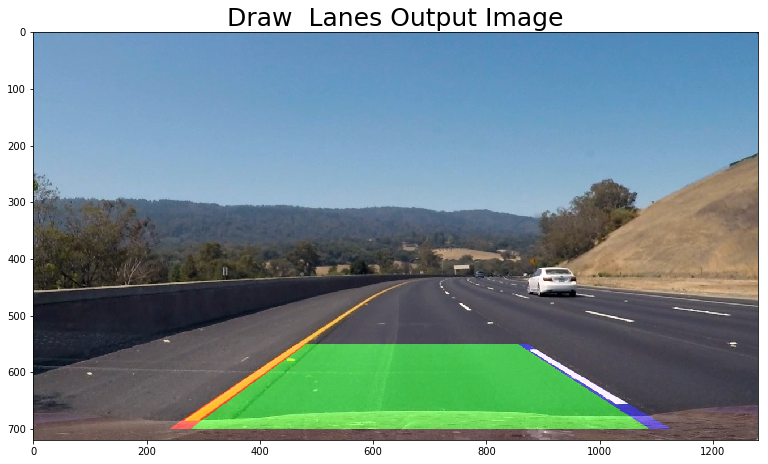

In [14]:
final = drawLanes(testImg, pipelineOut, left_fit, right_fit, Minv)
plt.figure(figsize=(15, 7.5))
plt.imshow(final)
plt.title("Draw  Lanes Output Image", fontsize=25)

# Draw curvature radius and distance from center data onto the original image

In [15]:
def  drawData(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_TRIPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + ' meters'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    
    text = '{:04.3f}'.format(abs_center_dist) + ' meters ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    
    return new_img

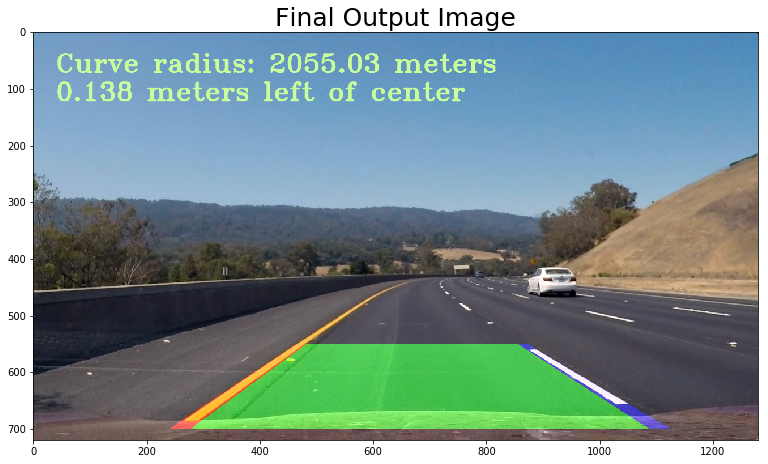

In [16]:
final_data = drawData(final, (left_rad + right_rad)/2, d_center)
plt.figure(figsize=(15, 7.5))
plt.imshow(final_data)
plt.title("Final Output Image", fontsize=25)

# Define a Line Class for Storing Data

In [17]:
class Line():
    def __init__(self):
        # Was the line detected in the last iteration?
        self.detected = False  
        
        # X values of the last n fits of the line
        self.recent_xfitted = [] 
        
        # Average x values of the fitted line over the last n iterations
        self.bestx = None    
        
        # Polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        
        # Polynomial coefficients for the most recent fit
        self.current_fit = []  
        
        # Radius of curvature of the line
        self.radius_of_curvature = None 
        
        # Distance of vehicle center from the line
        self.line_base_pos = None 
        
        # Difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
        # Number of detected pixels
        self.px_count = None
        
    def addFit(self, fit, inds):
        prevLinesCount = 20
        
        # Add a found fit to the line, up to prevLinesCount
        if fit is not None:
            if self.best_fit is not None:
                # Find difference between current fit and best fit
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.) and len(self.current_fit) > 0:
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                
                if len(self.current_fit) >= prevLinesCount:
                    # Keep newest prevLinesCount fits
                    self.current_fit = self.current_fit[len(self.current_fit)- prevLinesCount:]
                self.best_fit = np.average(self.current_fit, axis=0)
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # Delete the oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # best_fit is their average of all fits in the queue
                self.best_fit = np.average(self.current_fit, axis=0)


# Complete Pipeline

In [18]:
def processImage(image):
    new_image = np.copy(image)
    image_bin, Minv = pipeline(new_image)
    
    # If both left and right lines were detected last frame, use polyfitPrev, otherwise use slidingWindowPolyfit
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = slidingWindowPolyfit(image_bin)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = polyfitPrev(image_bin, l_line.best_fit, r_line.best_fit)
        
    # Delete both fits if the difference in their x-intercepts isn't around 375 px (+/- 100 px)
    if l_fit is not None and r_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = image.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        
        if abs(375 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    l_line.addFit(l_fit, l_lane_inds)
    r_line.addFit(r_fit, r_lane_inds)
    
    # Draw the current best fit
    if l_line.best_fit is not None and r_line.best_fit is not None:
        final_processed = drawLanes(new_image, image_bin, l_line.best_fit, r_line.best_fit, Minv)
        left_rad, right_rad, d_center = curvatureRadiusAndLaneCenterCal(image_bin, l_line.best_fit, r_line.best_fit, l_lane_inds, r_lane_inds)
        final_processed_out = drawData(final_processed, (left_rad + right_rad)/2, d_center)
    else:
        final_processed_out = new_image
        
    return final_processed_out

# Process Project Video

In [19]:
l_line  =  Line()
r_line  =  Line()
video_output1 = 'test_videos_output/project_video_out.mp4'
video_input1 = VideoFileClip("test_videos/project_video.mp4")
processed_video = video_input1.fl_image(processImage)
%time processed_video.write_videofile(video_output1, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output1))

[MoviePy] >>>> Building video test_videos_output/project_video_out.mp4
[MoviePy] Writing video test_videos_output/project_video_out.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [03:37<00:00,  5.79it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video_out.mp4 

Wall time: 3min 38s


In [20]:
l_line  =  Line()
r_line  =  Line()
video_output1 = 'test_videos_output/challenge_video_out.mp4'
video_input1 = VideoFileClip("test_videos/challenge_video.mp4")
processed_video = video_input1.fl_image(processImage)
%time processed_video.write_videofile(video_output1, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output1))

[MoviePy] >>>> Building video test_videos_output/challenge_video_out.mp4
[MoviePy] Writing video test_videos_output/challenge_video_out.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [01:21<00:00,  5.98it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge_video_out.mp4 

Wall time: 1min 21s


In [21]:
l_line  =  Line()
r_line  =  Line()
video_output1 = 'test_videos_output/harder_challenge_video_out.mp4'
video_input1 = VideoFileClip("test_videos/harder_challenge_video.mp4")
processed_video = video_input1.fl_image(processImage)
%time processed_video.write_videofile(video_output1, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output1))

[MoviePy] >>>> Building video test_videos_output/harder_challenge_video_out.mp4
[MoviePy] Writing video test_videos_output/harder_challenge_video_out.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [03:59<00:00,  5.02it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/harder_challenge_video_out.mp4 

Wall time: 4min
